## <center>WEB AND SOCIAL MEDIA ANALYTICS CAPSTONE PROJECT</center>

### Business Problem
- The client is a mobile manufacturer based in the US, which entered the market three years ago. 
- They want to understand their competitors and preferences of their users so that they can design their strategies accordingly. 
- They want to tweak the marketing strategies to add more value to their brand, provide features to customers that add the most value, and close the demand-supply gap. 

### Business objective
- To increase the market share as well as the brand value.
- To develop a new product optimally and create some marketing strategies.

### Table of contents
- Reading the data
- Data pre-processing
- EDA
- Text Analytics
- Machine Learning
- Summary

In [1]:
# importing necessary libraries
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from textblob import TextBlob, Word, Blobber
import cufflinks as cf
from collections import Counter
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)



pd.set_option('display.max_rows', None, 'display.max_rows', None, 'display.max_colwidth', None)

import warnings
warnings.filterwarnings("ignore")

### The following data sets are available
1.   meta data of type .json
2.   phone data of type .csv

The meta data holds information from sellers point of view and the phone data holds user information. 
We begin by unzipping the meta data file and extracting its content to a list



# Reading the  data



In [2]:
# path1 = '/Users/raphael/Desktop/Capstone Data/meta_Cell_Phones_and_Accessories.json'
path1 = '/Volumes/Elements/Capstone Data/meta_Cell_Phones_and_Accessories-001.json'

In [3]:
# Reading the unzipped meta data into a Python list. The result will be a list of dictionaries. 

# Empty list to store the dictonaries
phonemetadata = []

# Reading the dictionaries in the json file and appending it to the list phonemetadata[]
with open(path1, 'r') as f:
    for line in f:
        phonemetadata.append(json.loads(line))

In [4]:
# Getting the number of entries in the phonemetadata list
len(phonemetadata)

590071

In [5]:
#converting the list phonemetadata into a data frame
df_meta=pd.DataFrame(phonemetadata)

In [6]:
df_meta.head()

,category,tech1,description,fit,title,also_buy,image,tech2,brand,feature,rank,also_view,details,main_cat,similar_item,date,price,asin
0,"[Cell Phones & Accessories, Accessories, Screen Protectors]",,[],,Trollies Sing a Long Party VHS,[],[],,,[],"557,379 in Movies & TV (",[],{'ASIN: ': '6303195164'},Movies & TV,,,,6303195164
1,"[Cell Phones & Accessories, Accessories, Car Accessories, Car Cradles & Mounts]",,[],,La Pura VHS,[],[],,Maribel Guardia,[],"1,024,449 in Movies & TV (",[],{'ASIN: ': '630524412X'},Movies & TV,,,,630524412X
2,"[Cell Phones & Accessories, Cases, Holsters & Sleeves]",,"[New items to give you a new good mood, welcome to you have a happy shopping trip.]",,Leopard Thanksgiving Easter PC Black Case for Masterpiece Limited Design iphone 6 by Cases &amp; Mousepads,[],[],,,[],"5,315,017 in Books (",[],"{'Publisher:': 'juduiou', 'ASIN:': '6310200240', ' Product Dimensions: ': '11.5 x 1.1 x 5.8 inches', 'Shipping Weight:': '1 ounces'}",Books,,,,6310200240
3,"[Cell Phones & Accessories, Cases, Holsters & Sleeves, Basic Cases]",,"[A brand-new, unused, unopened, undamaged item in its original packaging (where packaging is applicable).]",,Puppies Faceplate Hard Case Protector for Net10 Wireless Straight Talk/net 10 Samsung Galaxy Discover Centura R740 S730g S738c,[],[],,Live2Pedal,"[Protect your phone with style through this Attractive Protector Case and make it tamper resistance, Delivers ultimate protection from scratches and molds perfectly to device's shape to highlight its beauty, Reinforced with hard plastic to the sides to ensure the durability of the case and to prolong the life of cellualar device, No tools required - Just Snap-On for a New Look in seconds]","[>#6,368,825 in Cell Phones & Accessories (See Top 100 in Cell Phones & Accessories), >#2,994,019 in Cell Phones & Accessories > Cases, Holsters & Clips > Basic Cases]",[],{},Cell Phones & Accessories,,,,6786501710
4,"[Cell Phones & Accessories, Cases, Holsters & Sleeves]",,"[A brand-new, unused, unopened, undamaged item in its original packaging (where packaging is applicable).]",,White Wolf Faceplate Protector Hard Case for Straight Talk Samsung S738c Galaxy Centura Prepaid Smartphone,[],[],,wirelessoutletusa,"[Protect your phone with style through this Attractive Protector Case and make it tamper resistance, Delivers ultimate protection from scratches and molds perfectly to device's shape to highlight its beauty, Reinforced with hard plastic to the sides to ensure the durability of the case and to prolong the life of cellualar device, Precise slots available for the top and side buttons, charger port/dock connector, headset jack and speaker to allow access to all controls and features on the phone, No tools required - Just Snap-On for a New Look in seconds]","[>#2,672,454 in Cell Phones & Accessories (See Top 100 in Cell Phones & Accessories), >#1,547,209 in Cell Phones & Accessories > Cases, Holsters & Clips]",[],{},Cell Phones & Accessories,,,,6786501273


In [7]:
#Reading the .csv file of the phone data into a dataframe
df_phonedata = pd.read_csv('/Volumes/Elements/Capstone Data/Cell_Phones_and_Accessories_5.csv')

In [8]:
df_phonedata.head()

,overall,verified,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image,review_sentiment
0,5.0,True,A24E3SXTC62LJI,7508492919,{'Color:': ' Bling'},Claudia Valdivia,"Looks even better in person. Be careful to not drop your phone so often because the rhinestones will fall off (duh). More of a decorative case than it is protective, but I will say that it fits perfectly and securely on my phone. Overall, very pleased with this purchase.",Can't stop won't stop looking at it,1407110400,NaN,NaN,POSITIVE
1,5.0,True,A269FLZCB4GIPV,7508492919,NaN,sarah ponce,When you don't want to spend a whole lot of cash but want a great deal...this is the shop to buy from!,1,1392163200,NaN,NaN,POSITIVE
2,3.0,True,AB6CHQWHZW4TV,7508492919,NaN,Kai,"so the case came on time, i love the design. I'm actually missing 2 studs but nothing too noticeable the studding is almost a bit sloppy around the bow, but once again not too noticeable. I haven't put in my phone yet so this is just what I've notice so far",Its okay,1391817600,NaN,NaN,NEGATIVE
3,2.0,True,A1M117A53LEI8,7508492919,NaN,Sharon Williams,DON'T CARE FOR IT. GAVE IT AS A GIFT AND THEY WERE OKAY WITH IT. JUST NOT WHAT I EXPECTED.,CASE,1391472000,NaN,NaN,POSITIVE
4,4.0,True,A272DUT8M88ZS8,7508492919,NaN,Bella Rodriguez,"I liked it because it was cute, but the studs fall off easily and to protect a phone this would not be recommended. Buy if you just like it for looks.",Cute!,1391385600,NaN,NaN,POSITIVE


In [9]:
df_phonedata.shape

(1128437, 12)

# Data pre-processing



### 1) Data transformation
- converting date & time to a readable format
- joining reviews dataframe with product informatiuon dataframe on ASIN

In [10]:
# Converting unix review time to date-time format

#Transforming unixReview time to date time format
from datetime import datetime, timedelta
df_phonedata['Date&Time'] = df_phonedata['unixReviewTime'].apply(lambda d: (datetime.fromtimestamp(d) - timedelta(hours=2)).strftime('%Y-%m-%d'))


In [11]:
# drop unixReview
df_phonedata.drop(columns = ['unixReviewTime'], inplace = True)

In [12]:
#merging both data frames to one
result = pd.merge(df_phonedata,df_meta,on='asin')

In [13]:
result.head(2)

,overall,verified,reviewerID,asin,style,reviewerName,reviewText,summary,vote,image_x,...,tech2,brand,feature,rank,also_view,details,main_cat,similar_item,date,price
0,5.0,True,A24E3SXTC62LJI,7508492919,{'Color:': ' Bling'},Claudia Valdivia,"Looks even better in person. Be careful to not drop your phone so often because the rhinestones will fall off (duh). More of a decorative case than it is protective, but I will say that it fits perfectly and securely on my phone. Overall, very pleased with this purchase.",Can't stop won't stop looking at it,NaN,NaN,...,,ELEGANI,"[Fashionable with unique 3D butterfly design for the iPhone 5 from others, Precise cut design with access to all ports and features of the iPhone 5, Dirt-resistant Butterfly Case for iPhone 5 with 3D PC Cover, Design: Simple hard back case, Luxury and classical butterfly, 3D art design. Creative 3D butterfly design]","[>#228,544 in Cell Phones & Accessories (See Top 100 in Cell Phones & Accessories), >#114,920 in Cell Phones & Accessories > Cases, Holsters & Clips]",[],{},Cell Phones & Accessories,,,
1,5.0,True,A269FLZCB4GIPV,7508492919,NaN,sarah ponce,When you don't want to spend a whole lot of cash but want a great deal...this is the shop to buy from!,1,NaN,NaN,...,,ELEGANI,"[Fashionable with unique 3D butterfly design for the iPhone 5 from others, Precise cut design with access to all ports and features of the iPhone 5, Dirt-resistant Butterfly Case for iPhone 5 with 3D PC Cover, Design: Simple hard back case, Luxury and classical butterfly, 3D art design. Creative 3D butterfly design]","[>#228,544 in Cell Phones & Accessories (See Top 100 in Cell Phones & Accessories), >#114,920 in Cell Phones & Accessories > Cases, Holsters & Clips]",[],{},Cell Phones & Accessories,,,


In [14]:
result.shape

(1129035, 29)

In [15]:
result.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1129035 entries, 0 to 1129034
Data columns (total 29 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   overall           1129035 non-null  float64
 1   verified          1129035 non-null  bool   
 2   reviewerID        1129035 non-null  object 
 3   asin              1129035 non-null  object 
 4   style             605459 non-null   object 
 5   reviewerName      1128879 non-null  object 
 6   reviewText        1128267 non-null  object 
 7   summary           1128510 non-null  object 
 8   vote              92176 non-null    object 
 9   image_x           27106 non-null    object 
 10  review_sentiment  1129035 non-null  object 
 11  Date&Time         1129035 non-null  object 
 12  category          1129035 non-null  object 
 13  tech1             1129035 non-null  object 
 14  description       1129035 non-null  object 
 15  fit               1129035 non-null  object 
 16  

### 2) Checking for null values
- dropping columns with significant number of null vlaues
- dropping records containg certain null values
- dropping coulumns that are not required for analysis
- conducting preproccessing on text based columns and creating word count columns for the same

In [16]:
# checking how many null values are present in each of the columns
# printing the %age of missing values per column to decide what operation to carry out 
def nullval(df):
    return round((df.isnull().sum()*100/len(df)).sort_values(ascending = False),2)

In [17]:
nullval(result)

image_x             97.60
vote                91.84
style               46.37
reviewText           0.07
summary              0.05
reviewerName         0.01
details              0.00
brand                0.00
feature              0.00
rank                 0.00
also_view            0.00
overall              0.00
main_cat             0.00
image_y              0.00
similar_item         0.00
date                 0.00
tech2                0.00
description          0.00
also_buy             0.00
title                0.00
fit                  0.00
verified             0.00
tech1                0.00
category             0.00
Date&Time            0.00
review_sentiment     0.00
asin                 0.00
reviewerID           0.00
price                0.00
dtype: float64

In [18]:
# check nurmerical Columns
result.select_dtypes(include=np.number).columns.tolist()

['overall']

In [19]:
# check categorical Colmns
pd.Categorical(result)

['overall', 'verified', 'reviewerID', 'asin', 'style', ..., 'details', 'main_cat', 'similar_item', 'date', 'price']
Length: 29
Categories (29, object): ['Date&Time', 'also_buy', 'also_view', 'asin', ..., 'tech2', 'title', 'verified', 'vote']

#### price column is not categorised as a numerical column

In [20]:
# Checking for how many columns are present with 45% of the data missing
#creating a variable null_column_45 for storing null columns having missing values more than 45%
    
null_column_45 = nullval(result)[nullval(result)>45]

In [21]:
# Drop all columns with missing values greater than 45%
result.drop(columns = null_column_45.index, inplace = True)

In [22]:
result.shape  


(1129035, 26)

In [23]:
# now we need to treat columns with very small percentage of null values by dropping those records starting with reviewText followed by summary and reviewer name
df = result.dropna(subset=['reviewText'])

In [24]:
df1 = df.dropna(subset=['summary'])

In [25]:
df2 = df1.dropna(subset=['reviewerName'])

In [26]:
df2.shape

(1127639, 26)

In [27]:
#convert date Date&Time dtype to datetime

df2['ReviewDateTime'] = pd.to_datetime(df2['Date&Time'])

In [28]:
# drop Date&Time
df2.drop(columns = ['Date&Time'], inplace = True)

In [29]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1127639 entries, 0 to 1129034
Data columns (total 26 columns):
 #   Column            Non-Null Count    Dtype         
---  ------            --------------    -----         
 0   overall           1127639 non-null  float64       
 1   verified          1127639 non-null  bool          
 2   reviewerID        1127639 non-null  object        
 3   asin              1127639 non-null  object        
 4   reviewerName      1127639 non-null  object        
 5   reviewText        1127639 non-null  object        
 6   summary           1127639 non-null  object        
 7   review_sentiment  1127639 non-null  object        
 8   category          1127639 non-null  object        
 9   tech1             1127639 non-null  object        
 10  description       1127639 non-null  object        
 11  fit               1127639 non-null  object        
 12  title             1127639 non-null  object        
 13  also_buy          1127639 non-null  object

In [30]:
df2.shape

(1127639, 26)

In [31]:
# deleting redundunt category from main category 
df2 = df2[df2['main_cat'].str.contains('<img src="https://images-na.ssl-images-amazon.com/images/G/01/nav2/images/gui/amazon-fashion-store-new._CB520838675_.png" class="nav-categ-image" alt="AMAZON FASHION"/>')==False]

In [32]:
df2.shape

(1126707, 26)

In [33]:
# defining a function to pre process textual data
def preprocess(ReviewText):
    ReviewText = ReviewText.str.replace("(<br/>)", "")
    ReviewText = ReviewText.str.replace('(<a).*(>).*(</a>)', '')
    ReviewText = ReviewText.str.replace('(&amp)', '')
    ReviewText = ReviewText.str.replace('(&gt)', '')
    ReviewText = ReviewText.str.replace('(&lt)', '')
    ReviewText = ReviewText.str.replace('(\xa0)', ' ')  
    return ReviewText


In [34]:
# preprocess reviews and store in new column
df2['reviewText'] = preprocess(df2['reviewText'])

In [35]:
# since there are multiple features stored in a list, creating a string versions of the same
feature_str =[]
for i in df2['feature']:
    x = str(i)
    feature_str.append(x)

In [36]:
# add feature string as a new column
df2['feature_str'] = (feature_str)

In [37]:
# preprocess features and store in new column
df2['feature_str'] = preprocess(df2['feature_str'])

In [38]:
# creating word count columns for reviews
df2['word_count'] = df2['reviewText'].apply(lambda x: len(str(x).split()))

In [39]:
# creating word count columns for reviews
df2['word_count_features'] = df2['feature_str'].apply(lambda x: len(str(x).split()))

In [40]:
# drop tech1 and tech2
df2.drop(columns = ['tech1','tech2'], inplace = True)


In [41]:
df2.shape

(1126707, 27)

In [42]:
# replace redundant values in price with empty quotes
df2['price'] = df2['price'].replace(['',
                                     '.a-box-inner{background-color:#fff}#alohaBuyBoxWidget .selected{background-color:#fffbf3;border-color:#e77600;box-shadow:0 0 3px rgba(228,121,17,.5)}#alohaBuyBoxWidget .contract-not-available{color:gray}#aloha-cart-popover .aloha-cart{height:auto;overflow:hidden}#aloha-cart-popover #aloha-cartInfo{float:left}#aloha-cart-popover #aloha-cart-details{float:right;margin-top:1em}#aloha-cart-popover .deviceContainer{width:160px;float:left;padding-right:10px;border-right:1px solid #ddd}#aloha-cart-popover li:last-child{border-right:0}#aloha-cart-popover .aloha-device-title{height:3em;overflow:hidden}#aloha-cart-popover .aloha-thumbnail-container{height:100px;margin-bottom:1em;text-align:center}#aloha-cart-popover .aloha-price-container{text-align:center}#aloha-cart-popover .aloha-thumbnail-container img{height:inherit}#aloha-cart-popover .aloha-cart{border-top:1px solid #ddd;border-bottom:1px solid #ddd}#aloha-cart-popover #aloha-cart-info{margin-right:0}#alohaBuyBoxWidget .without-contract-subheading{margin-right:0}#aloha-bb-help-nodes .aloha-bb-contract-term-heading{color:gray;font-family:arial;margin-top:.5em;text-align:center;height:.7em;border-bottom:1px solid gray;margin-bottom:1.6em}#aloha-bb-help-nodes .aloha-bb-contract-term-heading span{background-color:#fff;padding:0 10px 0 10px}#alohaAvailabilityUS_feature_div .availability a{text-decoration:none}#alohaPricingWidget a{text-decoration:none}#alohaAvailabilityUS_feature_div .availability{margin-top:-4px;margin-bottom:0}#alohaBuyBoxWidget .select-transaction-alert .a-icon-alert{top:18px;left:3px}#alohaBuyBoxWidget .select-transaction-alert .a-alert-container{padding-left:39px;width:290px}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget .contract-container .contract-term-heading a{text-decoration:none}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget .annual-contract-box .a-icon-popover{display:none}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget .contract-container .annual-contract-box{cursor:pointer;cursor:hand}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget .aloha-buybox-price{font-size:15px}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget #linkOffSection a{text-decoration:none}#alohaBuyBoxUS_feature_div .lockedUsedBuyboxContainer{padding-left:3.5%}#alohaBuyBoxUS_feature_div .alohaBuyboxUtilsNoWrap{white-space:nowrap}.hidden{display:none}.simo-no-padding{padding:0}.carrier-reviews-cell{padding-left:10px}.carrier-reviews-bordered-cell{border:1px dotted #ccc}.carrier-reviews-selected-cell{background-color:#ffd}#aloha-carrier-compatibility-modal-table-description{margin-top:10px;margin-bottom:14px}.aloha-carrier-compatibility-sortable-header.carrier{min-width:97px}.aloha-carrier-compatibility-sortable-header.compatibility{min-width:156px}.aloha-carrier-compatibility-sortable-header div{float:left}.aloha-carrier-compatibility-sortable-header i.a-icon{margin-left:10px;margin-top:4px}#aloha-carrier-compatibility-overview-table.a-bordered.a-vertical-stripes td:nth-child(2n),#aloha-carrier-compatibility-overview-table.a-bordered.a-vertical-stripes th:nth-child(2n){background-color:initial}#aloha-carrier-compatibility-modal-table.a-bordered.a-vertical-stripes td:nth-child(2n),#aloha-carrier-compatibility-modal-table.a-bordered.a-vertical-stripes th:nth-child(2n){background-color:initial}#aloha-carrier-compatibility-table.a-bordered.a-vertical-stripes th:nth-child(2n),.aloha-carrier-compatibility-table.a-bordered.a-vertical-stripes td:nth-child(2n){background-color:transparent}.aloha-carrier-compatibility-column-gray{background-color:#f6f6f6}.aloha-carrier-compatibility-modal-table-row .aloha-carrier-compatibility-tech-text,.aloha-carrier-compatibility-modal-table-row .carrier-name,.aloha-carrier-compatibility-modal-table-row .carrier-rating-summary{min-height:27px;display:inline-block;cursor:default}.aloha-carrier-compatibility-modal-table-row .aloha-carrier-compatibility-tech-text:first-line,.aloha-carrier-compatibility-modal-table-row .carrier-name:first-line,.aloha-carrier-compatibility-modal-table-row .carrier-rating-summary:first-line{line-height:27px}.aloha-carrier-compatibility-modal-table-row .aloha-carrier-compatibility-icon{margin-top:6px}.aloha-carrier-compatibility-check-icon{width:30px;height:27px;background-position:-318px -35px;background-image:url(https://images-na.ssl-images-amazon.com/images/G/01/AUIClients/AmazonUIBaseCSS-sprite_2x-8e7ef370dc28a214b3f490c9620f4ac501d5a864._V2_.png);background-repeat:no-repeat;background-size:400px 650px;display:inline-block;vertical-align:top}.aloha-carrier-compatibility-hidden{display:none}.aloha-buybox-spaced-link{margin-top:12px;margin-bottom:7px;text-align:center}.popover-tab',
                                    '\n\t\t                                            \n\r\n\r\n\r\n\r\n\r\n    \r\n    \r\n        \r\n        \n\n\n\n\n\n\n\n\n\n\n\n    \n    \n    \n       \n           <div class="a-section a-spacing-none"',
                                    '\n\t\t\t\t\t\t\t\t\t\t\t\t<span class="verticalAlign a-size-large"'],[np.nan,np.nan,np.nan,np.nan])

In [44]:
# check null vlaues again
nullval(df2)

price                  45.89
overall                 0.00
brand                   0.00
word_count              0.00
feature_str             0.00
ReviewDateTime          0.00
date                    0.00
similar_item            0.00
main_cat                0.00
details                 0.00
also_view               0.00
rank                    0.00
feature                 0.00
image_y                 0.00
verified                0.00
also_buy                0.00
title                   0.00
fit                     0.00
description             0.00
category                0.00
review_sentiment        0.00
summary                 0.00
reviewText              0.00
reviewerName            0.00
asin                    0.00
reviewerID              0.00
word_count_features     0.00
dtype: float64

In [45]:
# clean price and convert to numeric data type

cleaned_price = []
for i in df2.price:
    if type(i)==str and not ('-' in i):
        y = i.replace(',', '')
        x = float(y.strip('$'))      
        cleaned_price.append(x)
        
    elif type(i)==str and ('-' in i):
        x = i.split(' - ')
        y = [float(x[0].strip('$')),float(x[1].strip('$'))]
        z = (y[0]+y[1])/2
        cleaned_price.append(z)
        
    else: 
        cleaned_price.append(i)

In [46]:
# add cleaned price as a column
df2['cleaned_dollar_price'] = cleaned_price

#### From the perspective of the business objective, it is eminent to consider the fact that in the ever changing tech industry we need to gain insights into the latest market trends. 

In [47]:
# checking latest date
max(df2['ReviewDateTime'])

Timestamp('2018-10-02 00:00:00')

In [48]:
# Filter data between two dates
filtered_1 = df2.loc[(df2['ReviewDateTime'] >= '2015-10-02')
                     & (df2['ReviewDateTime'] < '2018-10-02')]

In [49]:
# creating a new dataframe to contain only relevant columns for further analysis
filtered_2 = filtered_1[['asin','ReviewDateTime',
                         'overall','reviewText',
                         'word_count','review_sentiment',
                         'main_cat','feature_str',
                         'word_count_features',
                         'brand','cleaned_dollar_price','also_view','similar_item','also_buy']]

In [50]:
filtered_2.describe()

,overall,word_count,word_count_features,cleaned_dollar_price
count,569453.000000,569453.000000,569453.000000,352818.000000
mean,4.240425,44.290308,103.629005,18.741134
std,1.234462,79.074516,74.217917,47.586393
min,1.000000,0.000000,1.000000,0.010000
25%,4.000000,6.000000,55.000000,7.530000
50%,5.000000,18.000000,91.000000,9.990000
75%,5.000000,49.000000,139.000000,15.990000
max,5.000000,5412.000000,939.000000,1150.000000


In [51]:
filtered_2['main_cat'].value_counts()

Cell Phones & Accessories       519647
All Electronics                  28885
Computers                         8905
Sports & Outdoors                 1677
Camera & Photo                    1586
Amazon Home                       1186
Home Audio & Theater              1125
Portable Audio & Accessories       941
Tools & Home Improvement           813
Car Electronics                    769
Health & Personal Care             640
Automotive                         544
Office Products                    544
Books                              406
Amazon Devices                     276
Industrial & Scientific            268
Apple Products                     223
All Beauty                         192
Toys & Games                       191
                                   150
Arts, Crafts & Sewing              124
Musical Instruments                104
GPS & Navigation                    75
Fire Phone                          62
Video Games                         51
Baby                     

In [52]:
# creating dataframe conating only smartphone related data
filtered_3 =filtered_2[filtered_2['main_cat'].str.contains('Cell Phones & Accessories')==True]

In [53]:
filtered_3.shape

(519647, 14)

In [54]:
# describe numeric data
filtered_3.describe()

,overall,word_count,word_count_features,cleaned_dollar_price
count,519647.000000,519647.000000,519647.000000,322531.000000
mean,4.239314,44.048104,102.937941,19.149420
std,1.234649,79.023960,72.763435,47.240123
min,1.000000,0.000000,1.000000,0.010000
25%,4.000000,6.000000,55.000000,7.850000
50%,5.000000,18.000000,90.000000,9.990000
75%,5.000000,49.000000,138.000000,16.980000
max,5.000000,5412.000000,939.000000,1150.000000


In [55]:
# to fill missing values lets look at different aggregations of price

x = [filtered_3['cleaned_dollar_price']]
for i in x:
    print('mean =',i.mean(),'\n',
    'median =',i.median(),'\n',
         'mode =',i.mode(),'\n')

mean = 19.149420117853914 
 median = 9.99 
 mode = 0    7.99
dtype: float64 



In [56]:
# use median price to fill null vlaues
filtered_3['cleaned_dollar_price'].fillna(9.99, inplace = True)

In [57]:
nullval(filtered_3)

asin                    0.0
ReviewDateTime          0.0
overall                 0.0
reviewText              0.0
word_count              0.0
review_sentiment        0.0
main_cat                0.0
feature_str             0.0
word_count_features     0.0
brand                   0.0
cleaned_dollar_price    0.0
also_view               0.0
similar_item            0.0
also_buy                0.0
dtype: float64

In [ ]:
filtered_3.describe()

#### Data Cleaning proccess ends

# EDA

### 1)Data Analysis for products under the cell phone category
- Over all analysis : count of sentiment, overall ratings, reviews over time, word count
- Sentiment analysis : overall ratings, reviews over time
- cell phone feature word count 

<AxesSubplot:>

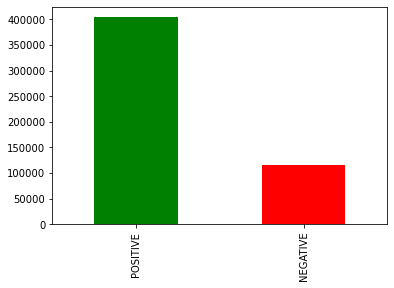

In [99]:
# Sentiment split
filtered_3.review_sentiment.value_counts().plot(kind='bar',color = ['g','r'])

<AxesSubplot:>

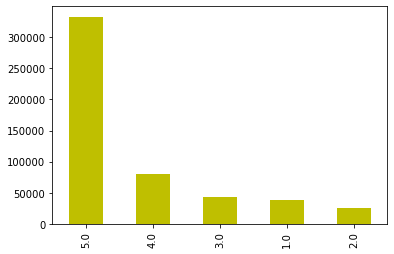

In [100]:
# overall rating distribution
filtered_3.overall.value_counts().plot(kind='bar', color = 'y')

<AxesSubplot:>

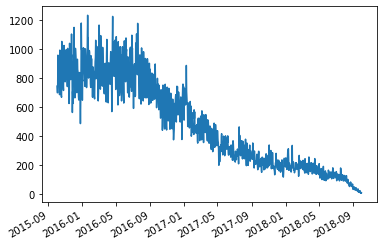

In [101]:
# trend line for reviews
filtered_3['ReviewDateTime'].value_counts().plot(kind='line')

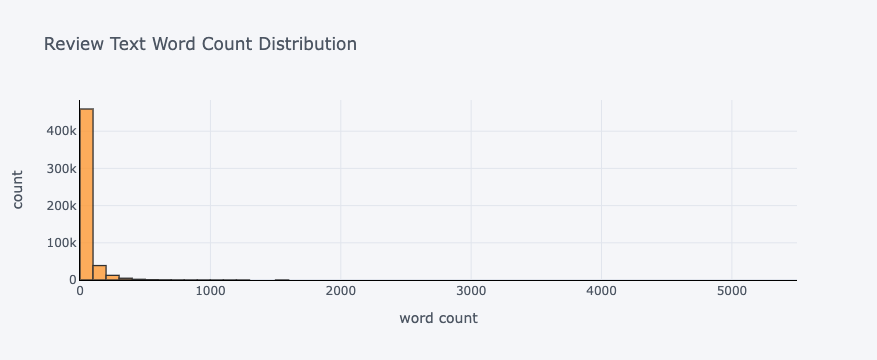

In [102]:
# review text count distribution
filtered_3['word_count'].iplot(
    kind='hist',
    bins=100,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    title='Review Text Word Count Distribution')

<AxesSubplot:xlabel='ReviewDateTime'>

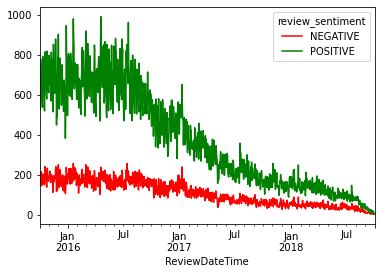

In [104]:
# trend line for review sentiments  
group_time_sent = filtered_3.groupby(by='ReviewDateTime')['review_sentiment'].value_counts()
unstacked = group_time_sent.unstack(level=1)
unstacked.plot.line(color=['r','g'])

#### check sentiment vs other columns

In [105]:
group_brand_sent = filtered_3.groupby(by='overall')['review_sentiment'].value_counts()
unstacked1 = group_brand_sent.unstack(level=1)

In [106]:
unstacked1 = group_brand_sent.unstack(level=1)

Text(0.5, 1.0, 'overall')

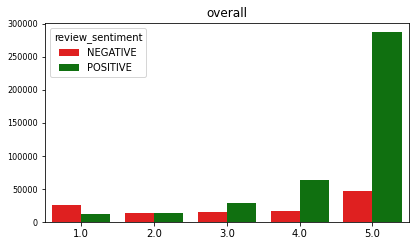

In [108]:
plt.figure(figsize = [30,30])
plt.subplot(7,4,2)
ax = sns.countplot(filtered_3['overall'], hue = filtered_3["review_sentiment"], palette = ["r","g"])
plt.yticks(fontsize=8)
plt.xlabel("")
plt.ylabel("")
plt.title('overall')

<AxesSubplot:xlabel='word_count'>

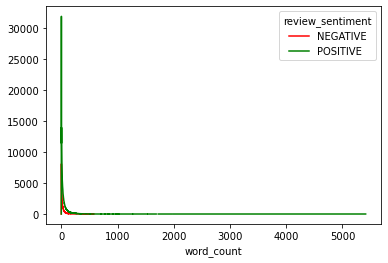

In [109]:
# Word count
group_word_count_sent = filtered_3.groupby(by='word_count')['review_sentiment'].value_counts()
unstacked2 = group_word_count_sent.unstack(level=1)
display(unstacked2.plot.line(color=['r','g']))

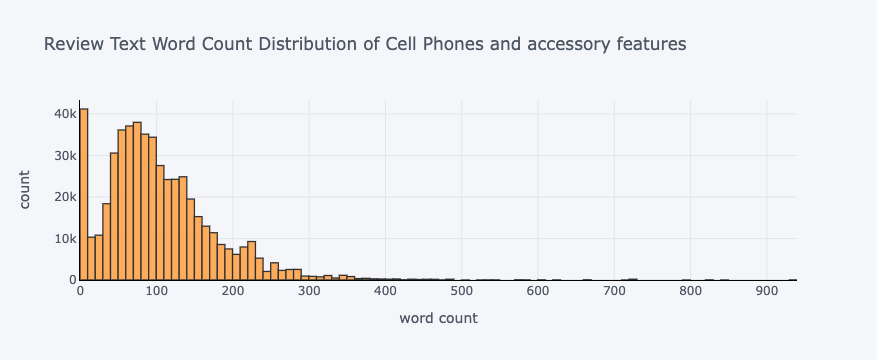

In [111]:
# cell phone feature word count 
filtered_3['word_count_features'].iplot(
    kind='hist',
    bins=100,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    title='Review Text Word Count Distribution of Cell Phones and accessory features')

#### From the exploratory analysis so far, we can see that:
- Positive sentiments are substatially high
- Most ratings are 5.0, whereas other ratings comparetivly are similar
- Time series analysis indicate that most of the reviews have been recorded from 2012 to 2018
- Most reviews dont cross the 100 word count

#### Therefore, keeping in mind the time series analysis, we should continue to derive insights from the last 4 years, i.e. 2014 to 2018 (since 2018 is that last recorded date).

#### Next steps:
- Conduct in depth analysis by exploiting the size of the data:
    - reviews related to cell phones and accessories in the last 4 years
    - features related to cell phones and accessories in the last 4 years

# Text Analytics

In [ ]:
# Reading stop words from a text file in to a list
stop_words = [line.rstrip('\n') for line in open('/Users/raphael/Desktop/stop_words_long.txt')]

In [ ]:
# import modules required
import nltk
from nltk.tokenize import sent_tokenize
from nltk.metrics.distance import jaccard_distance
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk import ngrams
from wordcloud import WordCloud
from collections import Counter
from PIL import Image
from wordcloud import ImageColorGenerator

import string
import spacy
from spacy.lang.en.stop_words import STOP_WORDS

In [ ]:
# create stop word list containg spacy stop words as well as stop words data provided
nlp = spacy.load('en_core_web_sm')
stopwords = list(STOP_WORDS)+stop_words

### 1) Text cleaning and standardizing for quantitative analysis
- removal of stop words, punctuations and lemmatizing from columns containing textual data
- creating separate columns to conating respective cleant data
- create a new dataframe with required columns for text analysis
- conduct sentiment analysis on:
    - all reviews
    - cell phone and accessory reviews
    - features of cell phone and accessory reviews
- export separate csv files for asthetic word cloud creation in tableau

In [ ]:
# cleaning and lemmatizing for textual data
stop = (set(stopwords))
exclude = set(string.punctuation)
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([str(i) for i in doc.lower().split() if i not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

In [ ]:
# compile documents for text review
doc_complete = filtered_3['reviewText']

doc_clean = [clean(doc).split() for doc in doc_complete] 

In [ ]:
# compile documents for features
doc_complete_feature = filtered_3['feature_str']

doc_clean_feature = [clean(doc).split() for doc in doc_complete_feature] 

In [ ]:
list(filtered_3.columns.values)

In [ ]:
# compile documents
dataset = filtered_3[['asin',
 'ReviewDateTime',
 'overall',
 'reviewText',
 'word_count',
 'review_sentiment',
 'main_cat',
 'feature_str',
 'word_count_features',
 'brand',
 'cleaned_dollar_price','also_view','similar_item','also_buy']]

In [ ]:
# Add cleaned docs to the dataset
dataset['doc_clean'] = doc_clean

In [ ]:
# Add cleaned feature to the dataset
dataset['feature_clean'] = doc_clean_feature

In [ ]:
# exporting this cleaned and pre proccessed data set
dataset.to_csv('/Users/raphael/Desktop/Capstone Data/dataset.csv')

### 2) Creating a dataframe contaning reviews/ features words and its word counts 

#### Text analytics for competitor brand data based on Tabluea Analysis

In [89]:
# Filter Rows by list of values
df_brand = dataset.query("brand in ('Samsung','Motorola','BLU','LG','Apple')")


In [90]:
# creating file to export word count to create positive and negative wordclouds in tableau

# positive
pos_df4 = df_brand[df_brand.review_sentiment.isin(['POSITIVE'])]

pos_key4=[]
for i in pos_df4['doc_clean']:
    for j in i:
        pos_key4.append(j)

pos4 = dict(Counter(pos_key4))
pos_4 = list(pos4.items())


# negative
neg_df4 = df_brand[df_brand.review_sentiment.isin(['NEGATIVE'])]

neg_key4=[]
for i in neg_df4['doc_clean']:
    for j in i:
        neg_key4.append(j)
        
neg4 = dict(Counter(neg_key4))
neg_4 = list(neg4.items())

# feature
# positive
pos_df5 = df_brand[df_brand.review_sentiment.isin(['POSITIVE'])]

pos_key5=[]
for i in pos_df5['feature_clean']:
    for j in i:
        pos_key5.append(j)

pos5 = dict(Counter(pos_key5))
pos_5 = list(pos5.items())


# negative
neg_df5 = df_brand[df_brand.review_sentiment.isin(['NEGATIVE'])]

neg_key5=[]
for i in neg_df5['feature_clean']:
    for j in i:
        neg_key5.append(j)
        
neg5 = dict(Counter(neg_key5))
neg_5 = list(neg5.items())


# create dataframe and export the data

df_neg_feat_brand = pd.DataFrame(neg_4,columns = ['Neg_feature_brand','Neg_Count_feat_brand'])
df_pos_feat_brand = pd.DataFrame(pos_4,columns = ['Pos_feature_brand','Pos_Count_feat_brand'])

df_neg_brand = pd.DataFrame(neg_5,columns = ['Neg_Word_brand','Neg_Count_brand'])
df_pos_brand = pd.DataFrame(pos_5,columns = ['Pos_Word_brand','Pos_Count_brand'])

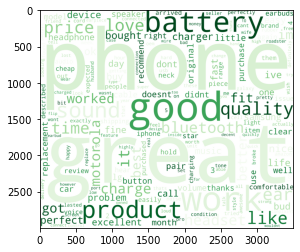

In [91]:
# wordcloud for top 200 positive keywords of comepetitor brands

wc_5 = WordCloud(background_color="white",width=3500,height=3000,
                 colormap = 'Greens_r', stopwords = stop,
               max_words=200,relative_scaling=0.5,
               normalize_plurals=False).generate_from_frequencies(pos4)
plt.imshow(wc_5)

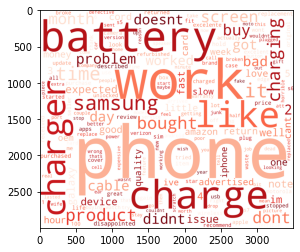

In [94]:
# wordcloud for top 200 negative keywords of comepetitor brands

wc_6 = WordCloud(background_color="white",width=3500,height=3000,
                 colormap = 'Reds_r', stopwords = stop,
               max_words=200,relative_scaling=0.5,
               normalize_plurals=False).generate_from_frequencies(neg4)
plt.imshow(wc_6)

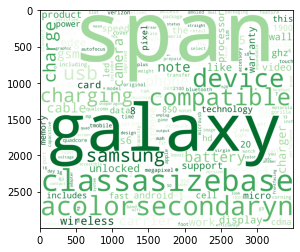

In [95]:
# wordcloud for top 200 positive features of comepetitor brands

wc_7 = WordCloud(background_color="white",width=3500,height=3000,
                 colormap = 'Greens_r', stopwords = stop,
               max_words=200,relative_scaling=0.5,
               normalize_plurals=False).generate_from_frequencies(pos5)
plt.imshow(wc_7)

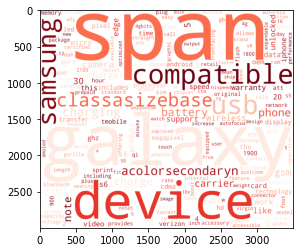

In [96]:
# wordcloud for top 200 positive features of comepetitor brands

wc_8 = WordCloud(background_color="white",width=3500,height=3000,
                 colormap = 'Reds_r', stopwords = stop,
               max_words=200,relative_scaling=0.5,
               normalize_plurals=False).generate_from_frequencies(neg5)
plt.imshow(wc_8)

In [92]:
# creating a combined dataframe all words and it's respective word count
key_df = pd.concat([df_neg, df_pos,df_neg_feat,df_pos_feat,df_neg_feat_brand,df_pos_feat_brand,df_neg_brand,df_pos_brand], axis=1)
key_df.head()

,Neg_Word,Neg_Count,Pos_Word,Pos_Count,Neg_feature,Neg_Count_feat,Pos_feature,Pos_Count_feat,Neg_feature_brand,Neg_Count_feat_brand,Pos_feature_brand,Pos_Count_feat_brand,Neg_Word_brand,Neg_Count_brand,Pos_Word_brand,Pos_Count_brand
0,didnt,153.0,didnt,264,rubberized,2.0,rubberized,5.0,work,135.0,good,440.0,safely,4.0,safely,9.0
1,like,295.0,fit,660,purple,3.0,purple,21.0,well,16.0,charger,66.0,charge,164.0,charge,335.0
2,worked,169.0,phone,2572,wave,1.0,wave,2.0,,17.0,great,463.0,phone,467.0,phone,892.0
3,work,622.0,good,2102,flower,3.0,flower,13.0,idk,3.0,product,196.0,car,54.0,car,117.0
4,well,130.0,charger,491,snap,68.0,snap,222.0,looking,4.0,expected,25.0,original,127.0,original,234.0


In [93]:
# exporting this data to csv for analysis in tableau
key_df.to_csv('/Users/raphael/Desktop/Capstone Data/keyword_dataset.csv')

## Machine Learning
- transform sentiment (target variables) to lables
- vectorize bag of keywords 
- split data into 70-30 train and test
- train logistic regression model using train data and check score
- predict using test data and check accuracy
- evaluate model with confusion matrix and check precision and recall

In [65]:
# import required modules

from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer 
from sklearn.metrics import accuracy_score 
from sklearn.model_selection import train_test_split 
from sklearn.base import TransformerMixin 
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn import preprocessing

#### Prepare the Data for Model Building

In [60]:
dataset = keydf

NameError: name 'keydf' is not defined

In [79]:
# Transform sentiment to labels
lb = preprocessing.LabelBinarizer()
target_labels=lb.fit_transform(dataset['review_sentiment'])

NameError: name 'dataset' is not defined

In [96]:
# Add transformed lables to dataset
dataset['labels_1']=target_labels

In [97]:
# Vecotorize bag of words
tokens_raw=[' '.join(t) for t in dataset['doc_clean']]
vectorizer = TfidfVectorizer()
X =vectorizer.fit_transform(tokens_raw)

In [98]:
# Features and Labels
ylabels = dataset['labels_1']

# Split data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, ylabels, test_size=0.3, random_state=42)

### Logistic Regression

In [102]:
# Train Logistic Regression Model 
model = LogisticRegression()
clf=model.fit(X_train,y_train)

# check score of the trained model
score =clf.score(X_train,y_train)*100
print(score)

95.53478712357217


In [103]:
# Start predictions with X_test
y_pred =clf.predict(X_test)

In [104]:
# Check accuracy of the prediction
metrics.accuracy_score(y_test, y_pred)

0.9237057220708447

### Naive Bayes

#### MultinomialNB

In [105]:
from sklearn.naive_bayes import MultinomialNB

In [106]:
# Train Multinomial Model 
MNB = MultinomialNB()
clf_mnb = MNB.fit(X_train,y_train)

# check score of the trained model
score_clf_mnb =clf_mnb.score(X_train,y_train)*100
print(score_clf_mnb)

77.81671858774662


In [107]:
# Start predictions with X_test
y_pred_mnb =clf_mnb.predict(X_test)

In [108]:
# Check accuracy of the prediction
metrics.accuracy_score(y_test, y_pred_mnb)

0.760823493793521

#### ComplementNB

In [109]:
from sklearn.naive_bayes import ComplementNB

In [110]:
# Train ComplementNB Model 
CNB = ComplementNB()
clf_cnb = CNB.fit(X_train,y_train)

# check score of the trained model
score_clf_cnb =clf_cnb.score(X_train,y_train)*100
print(score_clf_cnb)

92.1858774662513


In [111]:
# Start predictions with X_test
y_pred_cnb =clf_cnb.predict(X_test)

In [112]:
# Check accuracy of the prediction
metrics.accuracy_score(y_test, y_pred_cnb)

0.8658795034816833

#### BernoulliNB

In [113]:
from sklearn.naive_bayes import BernoulliNB

In [114]:
# Train BernoulliNB Model 
BNB = BernoulliNB()
clf_bnb = BNB.fit(X_train,y_train)

# check score of the trained model
score_clf_bnb =clf_bnb.score(X_train,y_train)*100
print(score_clf_bnb)

86.55244029075804


In [115]:
# Start predictions with X_test
y_pred_bnb =clf_bnb.predict(X_test)

In [116]:
# Check accuracy of the prediction
metrics.accuracy_score(y_test, y_pred_bnb)

0.8180442022403875

## Model Evaluation of Logistic Regression

In [117]:
# Print confusion matrix
confusion = metrics.confusion_matrix(y_test, y_pred)
print(confusion)

[[ 745  163]
 [  89 2306]]


In [118]:
# check roc score of prediction
auc = metrics.roc_auc_score(y_test, y_pred)
print('AUC: %.3f' % auc)

AUC: 0.892


In [119]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)

In [120]:
# calculate precision-recall curve
precision, recall, thresholds = metrics.precision_recall_curve(y_test, y_pred)

In [121]:
# Substituting the value of true positive
TP = confusion[1,1]
# Substituting the value of true negatives
TN = confusion[0,0]
# Substituting the value of false positives
FP = confusion[0,1] 
# Substituting the value of false negatives
FN = confusion[1,0]

## Sensitivity and Specificity

In [122]:
# Calculating the sensitivity
sensi1 =  TP/(TP+FN)
sensi1

0.962839248434238

In [293]:
# Calculating the specificity
speci1 = TN/(TN+FP)
speci1

0.8505671023087109

## Precision and Recall

In [294]:
# Precision = TP / TP + FP
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.9575708038742899

In [295]:
#Recall = TP / TP + FN
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.9669602251623926

### <center>Summary</center>
- Data Pre-processing
    - Joined reviews and product information on ASIN
    - Treated null vlaues, redundant columns and data discrepancies
    - Created new columns containing feature and review word count
    - Filtered data to keep only records containing cell phone related data from the last 3 years
- Exploratory data analysis
    - Plotted various graphs to analyse distribution of data
    - Conduct sentiment analysis of on the spread of data
    - Exported the cleaned and filtered data set as a csv to analyze in Tableau
    - Initial analysis indicate that the top 5 brands are 'Samsung', 'Motorola', 'BLU', 'LG' and 'Apple'
- Text analytics
    - Text analytics for competitor brand data
    - Creating a dataframe contaning reviews/ features words and its word counts 
    - Sentiment analysis on reviews and features
    - Creating word clouds
    - Exporting word and word count based on setiment
- Machine Learning
    - Trying to find the best algorithm amongst Logistic Regression and Naive Bayes (Multinomial, Complement and Bernoulli)
    - Logistic regression and Complement Naïve Bayes algoritms provide best results 
    